# Classification of Cuisines using Recipe Ingredients - Exploration and Analysis

Food is a massive and complex arena in which culture, geography, climate, and social factors combine to create unique cuisines around the world. With the age of the internet, millions of recipes are now shared instantly and easily accessible. Many ingredients previously specific to certain regions of the world are now also widely available due to online commerce. This project aims to identify the signatures of particular cuisines.

### Objectives

For this section I will attempt to answer the following questions:

1. What are the most frequently used ingredients for each cuisine?
2. Is there any regional or cultural information that can be extracted from the ingredients used in each cuisine?
3. Are there particular ingredients that are often paired together?

In [22]:
# import packages to read and work with data
import pandas as pd
import numpy as np
from collections import defaultdict
from random import shuffle

# Visualization packages
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from wordcloud import WordCloud, ImageColorGenerator
from PIL import Image

# Packages for working with text data
from nltk import tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE


In [3]:
# Load the cleaned dataset from the data folder
data = pd.read_pickle('data/data_clean.pkl')

# Preview the first few rows
data.head()

,cuisine,ingredients,words
id,,,
10259,greek,"[feta cheese crumbles, olive, grape tomato, on...","[pepper, crumbles, olive, lettuce, tomato, rom..."
25693,southern_us,"[corn meal, milk, thyme, flour, salt, tomato, ...","[meal, milk, thyme, vegetable, flour, salt, to..."
20130,filipino,"[garlic powder, salt, cooking oil, onion, chic...","[mayonnaise, powder, soy, salt, onion, chicken..."
22213,indian,"[water, salt, vegetable oil]","[wheat, vegetable, salt, water, oil]"
13162,indian,"[milk, bay leaf, shallot, chili powder, garlic...","[leaf, masala, onion, garam, cayenne, yogurt, ..."


The **ingredients** column provides a list of ingredients, while the **words** column provides us with a unique set of words found in each respective ingredients list. We will use both columns for analysis.

Below is a list of all of the cuisines represented in this dataset.

In [4]:
data.cuisine.value_counts()

italian         7835
mexican         6437
southern_us     4317
indian          3002
chinese         2673
french          2643
cajun_creole    1546
thai            1538
japanese        1423
greek           1174
spanish          989
korean           830
vietnamese       825
moroccan         821
british          803
filipino         755
irish            664
jamaican         526
russian          489
brazilian        467
Name: cuisine, dtype: int64

### 1. What are the most frequently used ingredients in each cuisine?

We can get an idea of the ingredients used in each cuisine by splitting ingredients and words by categories.

In [5]:
# Create a list to hold separated ingredients and word lists for each cuisine
cuisines = list(data.cuisine.value_counts().index)

# loop through each entry and separate entries by cuisine
i = 0
for cuisine in data.cuisine.value_counts().index:
    cuisines[i] = data[data.cuisine == cuisine]
    i += 1

Now that we have separated the lists by cuisine, it's a pretty straightforward task to analyze each 

In [6]:
cuisines[1].head()

,cuisine,ingredients,words
id,,,
16903,mexican,"[pepper, jalapeno pepper, corn tortilla, salt,...","[cilantro, tortilla, fresh, poblano, olive, ch..."
41995,mexican,"[cilantro, coriander, chili powder, cinnamon, ...","[cilantro, powder, coriander, flank, olive, ch..."
40523,mexican,"[cilantro, salt, rom tomato, lime, onion, jala...","[cilantro, pepper, salt, tomato, lime, onion, ..."
1299,mexican,"[cheese, flour tortilla, egg]","[tortilla, flour, sausage, cheese, egg]"
10276,mexican,"[garlic powder, chili powder, sea salt, cumin,...","[powder, sea, chili, salt, cumin, onion, papri..."


We will use a collection of wordclouds since: 1) They are a pretty good way to visualize the most common ingredients found in any subset of our data, and 2) They are really fun.

Below are a collection of wordclouds generated from their respective ingredients lists.

In [7]:
cuisine_ingredients = defaultdict(list)
cuisine_words = defaultdict(list)
world_ingredients = []

for category in cuisines:
    cuisine = category.cuisine.head(1).values[0]
    for ingredients in category.ingredients:
        cuisine_ingredients[cuisine] += ingredients
        
for i in data.ingredients:    
    world_ingredients.extend(i)

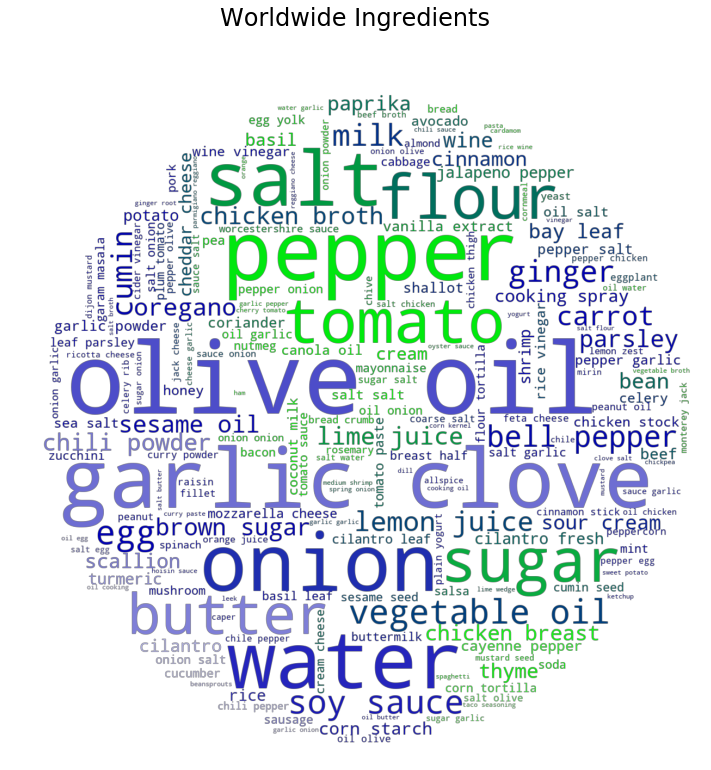

In [8]:
# Create a wordcloud to show most common ingredients worldwide
text = ', '.join(sample(world_ingredients, len(world_ingredients)))

# load data for mask
mask = np.array(Image.open('data/masks/world.jpg'))
image_colors = ImageColorGenerator(mask)

# Generate wordcloud using text
wc = WordCloud(background_color=None,
               mode='RGBA',
               color_func=image_colors,
               mask=mask).generate(text)

# create plot of wordcloud
plt.subplots(figsize=(12,12))
plt.imshow(wc, interpolation='bilinear')
plt.suptitle('Worldwide Ingredients', fontsize=24)
plt.axis("off")

# Save the wordcloud to a file
plt.savefig('data/wordclouds/world.png', format='png', dpi=100)

plt.show()

In [9]:
# create dictionary for colormaps of each cuisine place of origin
cuisine_colors = dict(zip(cuisine_ingredients.keys(), ['RdYlGn', 'RdYlGn', 'seismic', 'BrBG',
                                                       'autumn', 'seismic', 'Blues', 'coolwarm',
                                                       'Reds', 'Blues', 'autumn', 'bwr', 'autumn',
                                                       'RdYlGn', 'bwr', 'RdYlBu', 'BrBG', 'summer',
                                                       'coolwarm', 'summer']))

In [10]:
def make_word_clouds(cuisine_list, dictionary, cuisine_colors=cuisine_colors):
    """
    This function displays word clouds based on term frequency and cuisine category
    """
    
    for i in range(len(cuisine_list)):
        # Combine all ingredients into single string
        to_shuffle = dictionary[cuisine_list[i]]
        shuffle(to_shuffle)
        text = ', '.join(to_shuffle)

        # load data from path
        open_path = 'data/masks/' + cuisine_list[i] + '.jpg'
        mask = np.array(Image.open(open_path))
        
        # Generate wordcloud using text
        wc = WordCloud(background_color=None,
                       mode='RGBA',
                       colormap=cuisine_colors[cuisine_list[i]],
                       mask=mask).generate(text)

        # create plot of wordcloud
        plt.subplots(figsize=(12,12))
        plt.imshow(wc, interpolation='bilinear')
        plt.suptitle(cuisine_list[i].title(), fontsize=24)
        plt.axis("off")
        
        # Save the wordcloud to a file
        save_path = 'data/wordclouds/' + cuisine_list[i] + '.png'
        plt.savefig(save_path, format='png', dpi=100)

        plt.show()

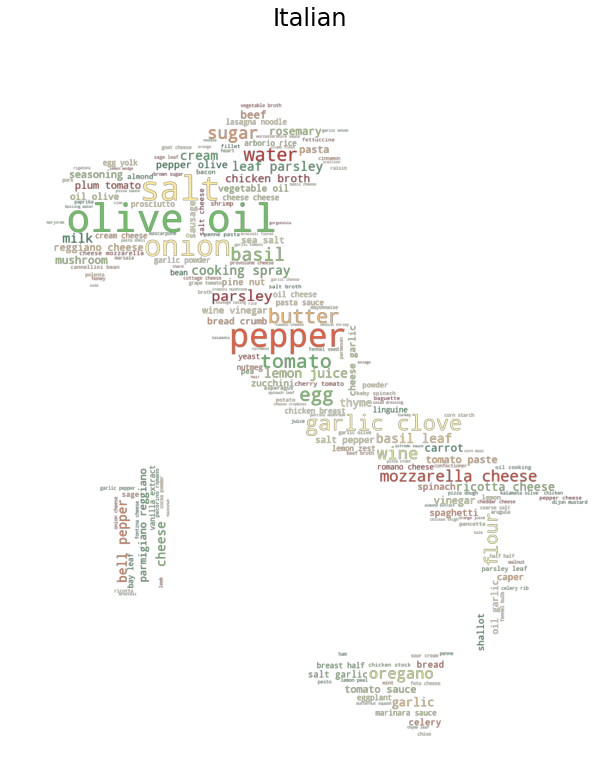

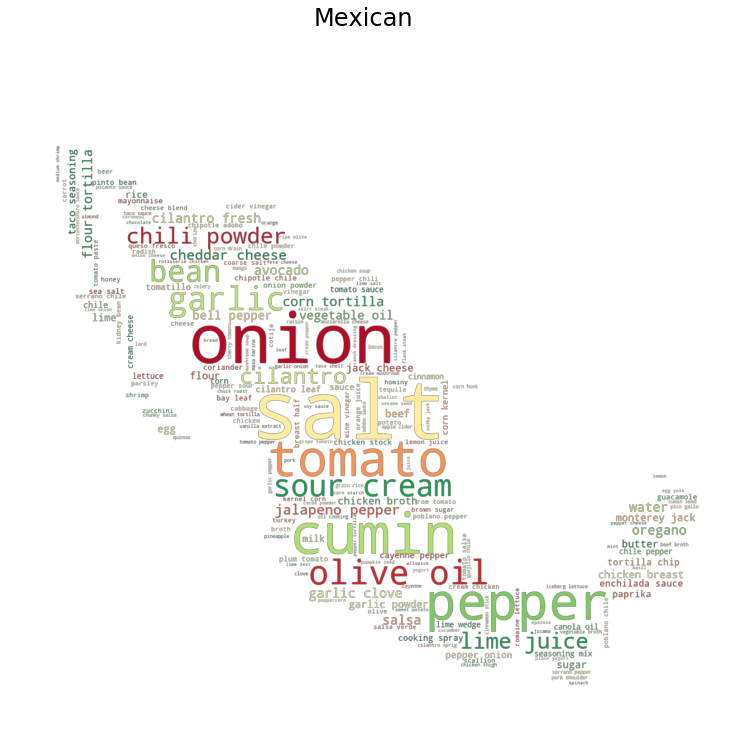

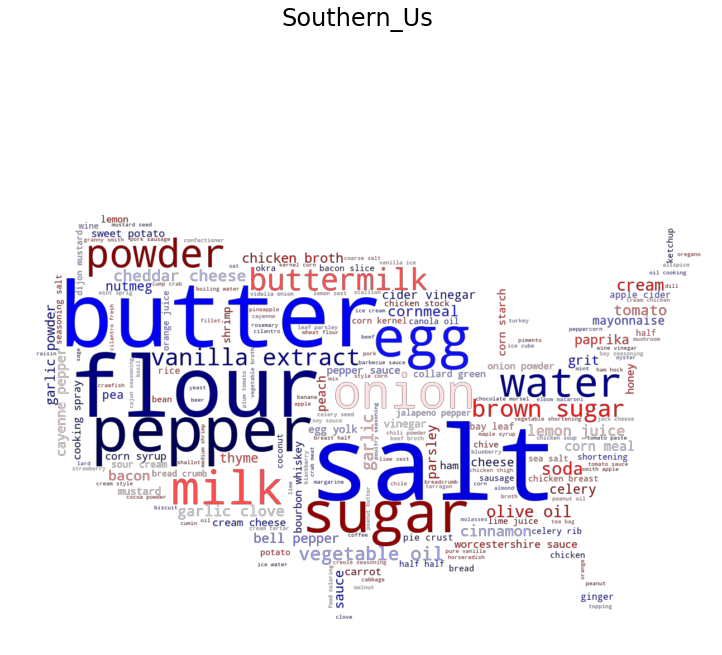

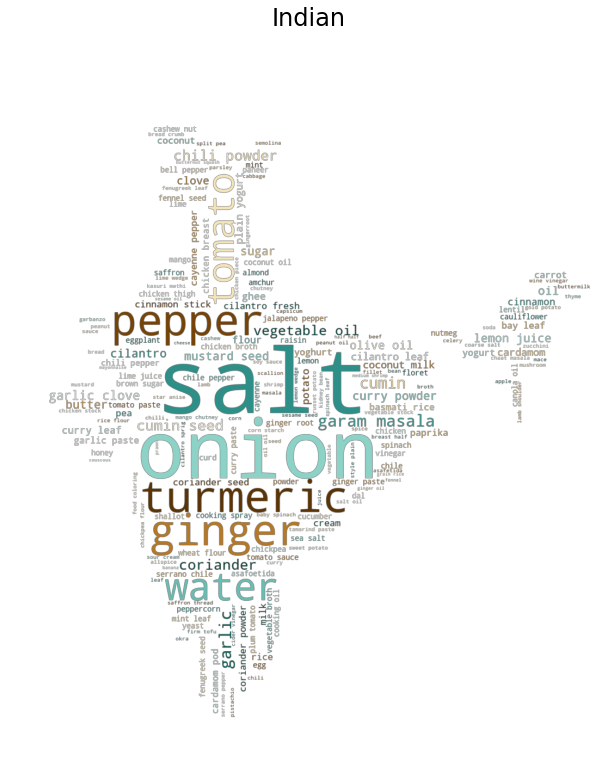

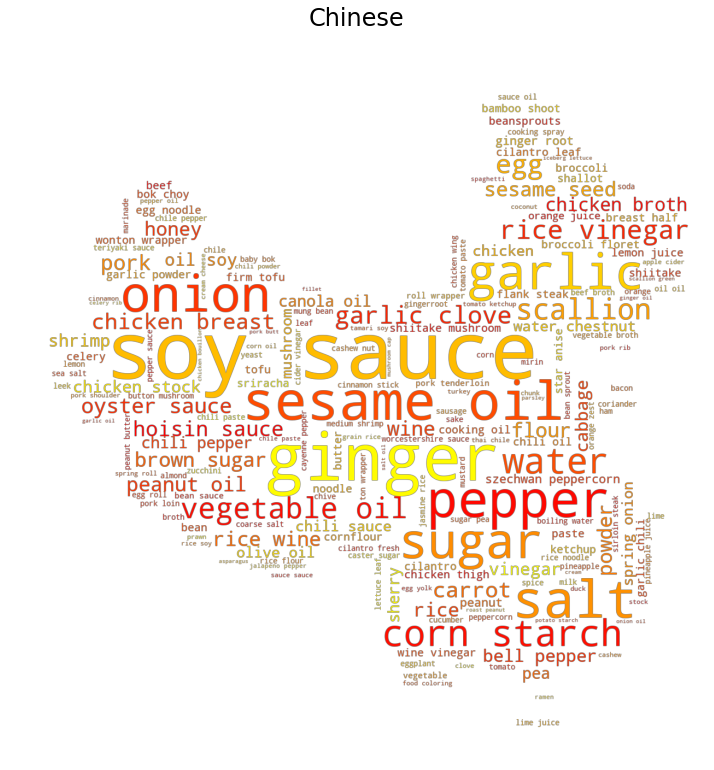

...

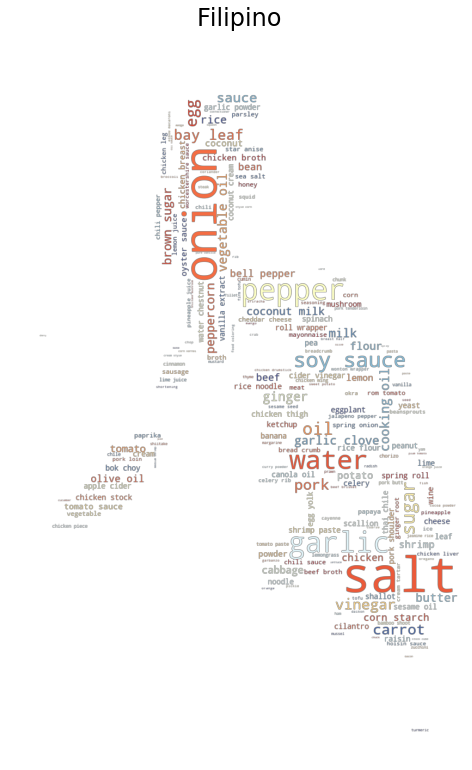

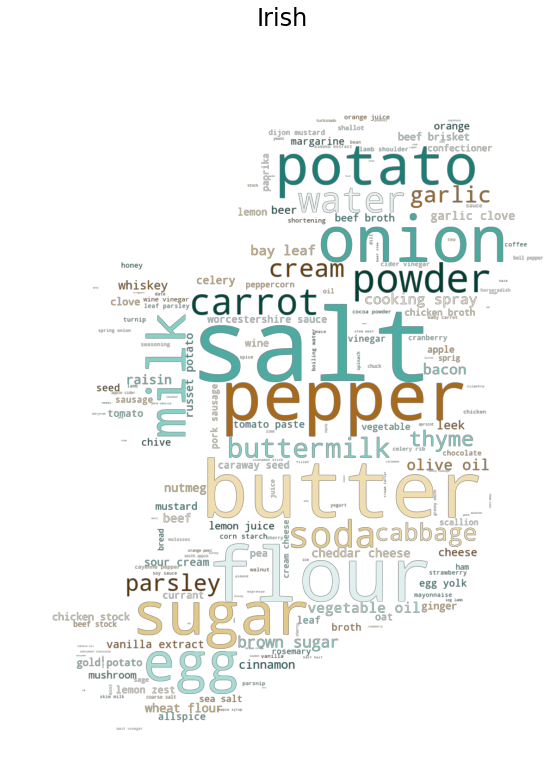

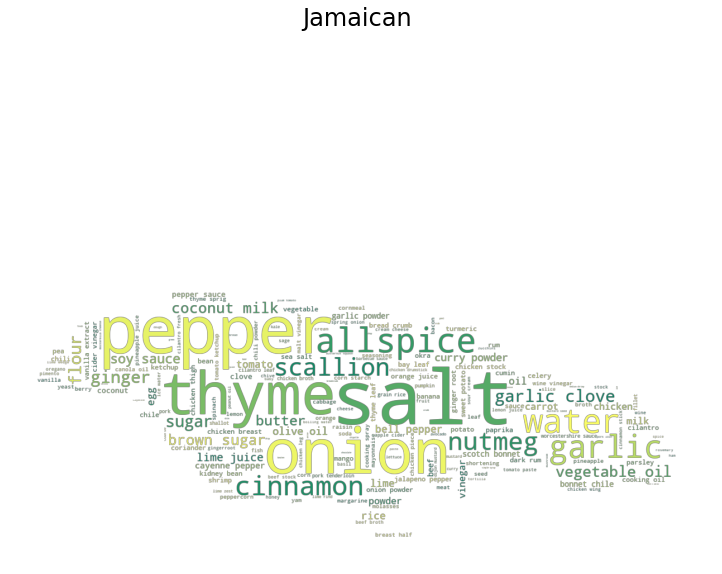

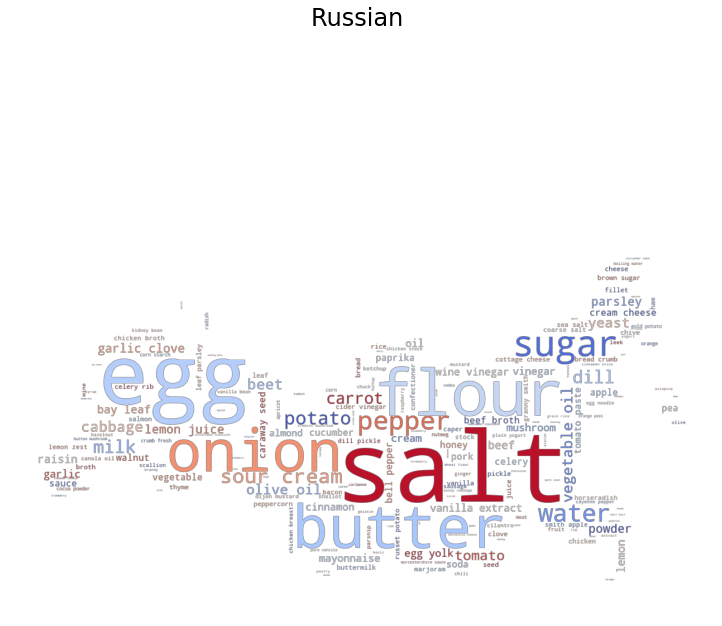

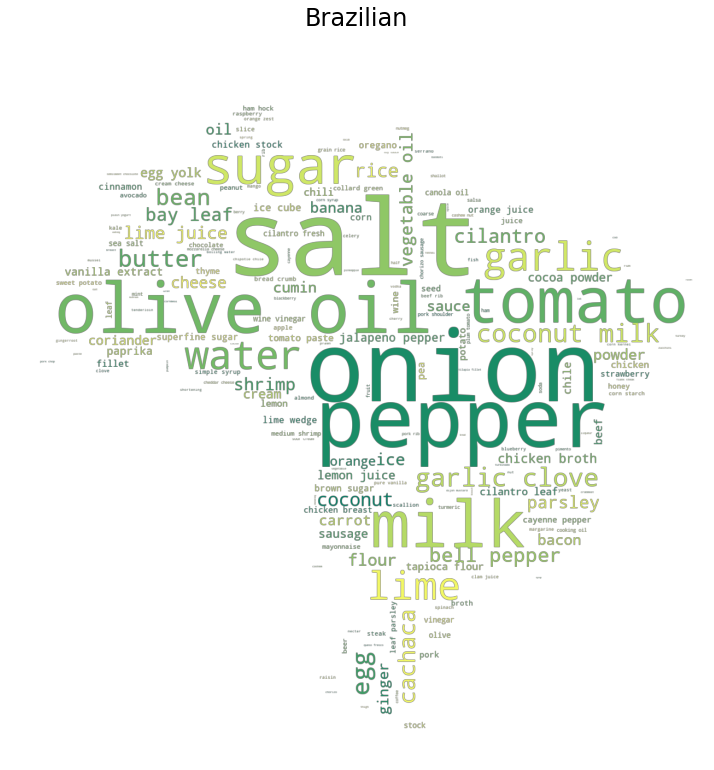

In [11]:
cuisine_list = list(cuisine_ingredients.keys())

make_word_clouds(cuisine_list, cuisine_ingredients)

There are a few things we can see by looking briefly through the wordclouds above. Firstly, ingredients like salt and onions seem to be ubiquitous, represented in every cuisine of our dataset. Alternatively, there are some clearly unique ingredients widely used in some cuisines, such as cumin in Mexican recipes, turmeric in Indian, soy sauce in Asian cuisines such as Japanese and Chinese, coconut milk in Thai and lime in Brazilian cuisine. These standouts may definitely help us to build a model of cuisine prediction later on, if they can be weighted more importantly than those which appear in all cuisines.

We can also see rankings of the average lengths of ingredients lists for each cuisine to get an idea of which cuisines enjoy more complex dishes than others.

In [12]:
# Create a dictionary to hold lengths of ingredients
ingredient_lengths = defaultdict(list)

for i in range(len(cuisines)):
    # Identify category of cuisine
    category = cuisines[i].cuisine.head(1).values[0]
    temp_list = []
    # Append lengths of recipes for each cuisine to ingredient_lengths
    for recipe in cuisines[i].ingredients:
        temp_list.append(len(recipe))
        
    ingredient_lengths[category] = temp_list

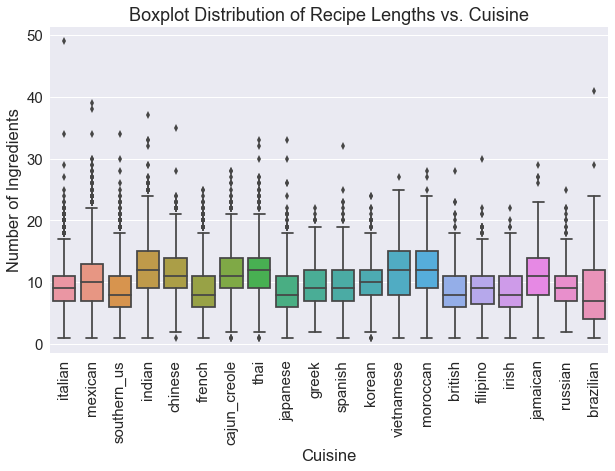

In [13]:
sns.set(font_scale=1.5)

plt.subplots(figsize=(10, 6))
sns.boxplot(data=list(ingredient_lengths.values()))
plt.xticks(range(len(ingredient_lengths.keys())), list(ingredient_lengths.keys()), rotation='vertical')
plt.title('Boxplot Distribution of Recipe Lengths vs. Cuisine')
plt.xlabel('Cuisine')
plt.ylabel('Number of Ingredients')

plt.show()

This graph shows a nice distribution of ingredient length statistics, but it would be more convient to have an ordered version for comparison.

In [14]:
mean_lengths = []
for key in ingredient_lengths.keys():
    mean_lengths.append(np.mean(ingredient_lengths[key]))

sorted_lengths = [i[0] for i in sorted(enumerate(mean_lengths), key=lambda x:x[1], reverse=True)]
print(sorted_lengths)

[13, 3, 7, 12, 6, 4, 17, 11, 1, 10, 9, 18, 0, 15, 5, 8, 2, 14, 16, 19]


In [15]:
sorted_ingredient_keys = [list(ingredient_lengths.keys())[x] for x in sorted_lengths]
print(sorted_ingredient_keys)

sorted_ingredient_lengths = [list(ingredient_lengths[key]) for key in sorted_ingredient_keys]

['moroccan', 'indian', 'thai', 'vietnamese', 'cajun_creole', 'chinese', 'jamaican', 'korean', 'mexican', 'spanish', 'greek', 'russian', 'italian', 'filipino', 'french', 'japanese', 'southern_us', 'british', 'irish', 'brazilian']


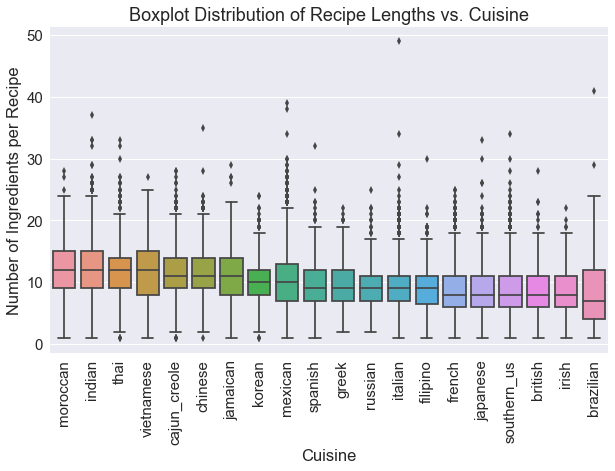

In [16]:
plt.subplots(figsize=(10, 6))
sns.boxplot(data=sorted_ingredient_lengths)
plt.xticks(range(len(sorted_ingredient_keys)), sorted_ingredient_keys, rotation='vertical')
plt.title('Boxplot Distribution of Recipe Lengths vs. Cuisine')
plt.xlabel('Cuisine')
plt.ylabel('Number of Ingredients per Recipe')

plt.show()

It looks like cuisines like Moroccan, Indian and Thai use the most ingredients per recipe, while British, Irish and Brazilian cuisines have slightly simpler recipe lists.

It may also be useful to see which cuisines use the widest variety of ingredients to get an idea of the breadth of ingredients or flavors that make up each cuisine.

In [17]:
# List number of unique ingredients for each cuisine
unique_cuisine_ingredients = defaultdict(int)

for i in range(len(sorted_ingredient_keys)):
    unique_cuisine_ingredients[sorted_ingredient_keys[i]] = len(set(cuisine_ingredients[sorted_ingredient_keys[i]]))

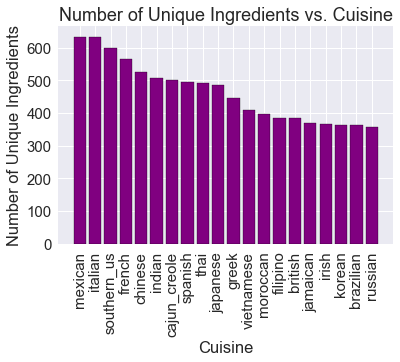

In [18]:
# Generate plot to visualize the unique ingredients per cuisine
unique_cuisine_ingredient_keys = sorted(unique_cuisine_ingredients, key=unique_cuisine_ingredients.get, reverse=True)
unique_cuisine_ingredient_list = [unique_cuisine_ingredients[x] for x in unique_cuisine_ingredient_keys]

plt.bar(range(len(unique_cuisine_ingredient_list)), unique_cuisine_ingredient_list, edgecolor='k', facecolor='purple')
plt.xticks(range(len(unique_cuisine_ingredient_list)), unique_cuisine_ingredient_keys, rotation='vertical')
plt.xlabel('Cuisine')
plt.ylabel('Number of Unique Ingredients')
plt.title('Number of Unique Ingredients vs. Cuisine')
plt.show()

We can see that although Moroccan, Indian and Thai lead with the most ingredients per recipe, the kitchens of Mexican, Italian and Southern U.S. cuisines are stocked with a larger variety of ingredients in our dataset. In all cases, Brazilian cuisine tends to be a simpler affair.


### Preparing data for Vectorization (TF-IDF weighted Processing)

While the visualizations above are nice, ubiquitous ingredients such as onion, salt, and garlic tend to obscure the ingredients unique to each cuisine. In order to account for this distribution and extract the ingredients that form a "signature" of each cuisine, we will use TF-IDF weighting which will give higher importanct to words which mainly appear in their respective category, and not across many cuisines.

Before we can proceed to apply this weighting to our cuisine ingredient lists, the ingredient lists for recipes of each cuisine will be normalized to be approximately the same length to adjust for cuisines that have a wide difference in the number of recipes represented. We will choose a random sample set of 20,000 ingredients for each cuisine for our analysis (the mean ingredients for all recipes is ~10, so this approximates about 2,000 recipes each).

In [19]:
# Generate samples to create cuisine ingredient lists of equal length
normed_cuisine_ingredients = defaultdict(list)
for cuisine in cuisine_list:
    normed_cuisine_ingredients[cuisine] = ', '.join(list(np.random.choice(cuisine_ingredients[cuisine], size=20000)))

In [23]:
# Create list of ingredient strings to pass to TF-IDF
normed_cuisine_keys = list(sorted(normed_cuisine_ingredients.keys()))
normed_cuisines_list = [normed_cuisine_ingredients[x] for x in normed_cuisine_keys]

# Custom tokenizer to separate list into tokens by commas
tokenized = tokenize.regexp.RegexpTokenizer(pattern=", ", gaps=True)

# Create TF-IDF weighting dictionary for each cuisine, exclude terms that appear in every cuisine
tfidf = TfidfVectorizer(tokenizer=tokenized.tokenize, max_df=0.95)

# Fit and transform cuisine ingredient lists to generate sparse matrix
cuisines_weighted = tfidf.fit_transform(normed_cuisines_list)

In [24]:
# Plot feature importances for top 10 features of each cuisine
def plot_top_ingredients(sparse_matrix):
    
    plt.subplots(figsize=(14,60))
    
    for i in range(sparse_matrix.shape[0]):
        top_ingredients = []
        top_scores = []
        top_indices = sorted([x for x in range(len(tfidf.get_feature_names()))], key=lambda x: cuisines_weighted[i, x], reverse=True)
        
        for index in top_indices[:10]:
            top_ingredients.append(tfidf.get_feature_names()[index])
            top_scores.append(cuisines_weighted[i, index])
        
        plt.subplot(10, 2, i+1)
        plt.bar(range(10), top_scores, edgecolor='k')
        plt.ylabel('TF-IDF Score')
        plt.title(normed_cuisine_keys[i].title())
        plt.xticks(range(10), top_ingredients, rotation='vertical')
        
    plt.tight_layout()
    plt.show()

        

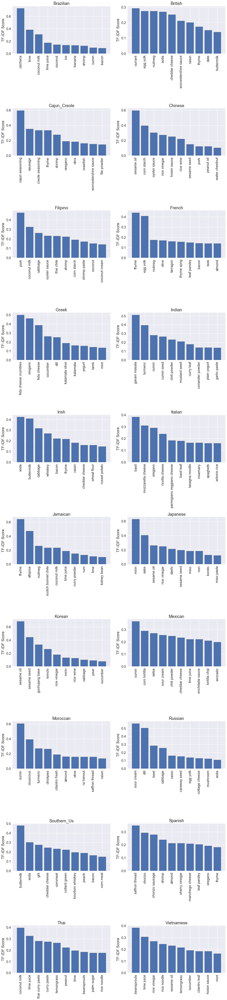

In [25]:
plot_top_ingredients(cuisines_weighted)

The plots above show us a much better representation of which ingredients form the unique signature of each cuisine. We can also use this grouping to see how similar cuisines are, as shown below.

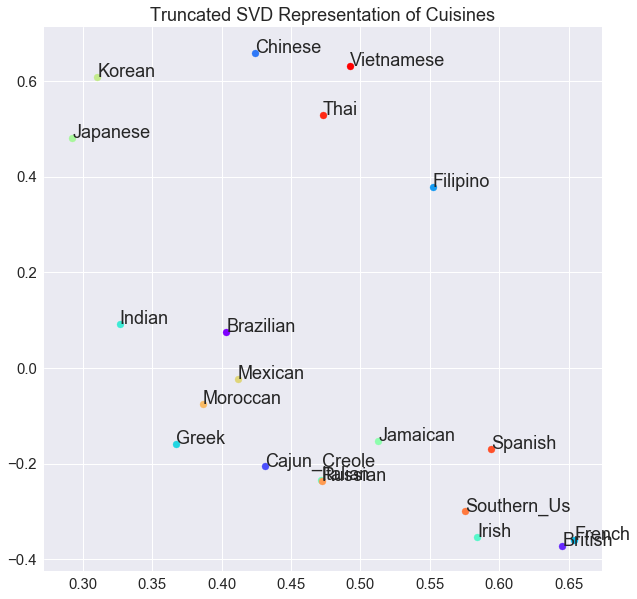

In [26]:
# Project the vectors onto 2 dimensional space
svd = TruncatedSVD()
docs = svd.fit_transform(cuisines_weighted)

# Create colors and labels for cuisines
colors = iter(cm.rainbow(np.linspace(0, 1, docs.shape[0])))
labels = iter(normed_cuisine_keys)

# Create a scatterplot visualizing similarities between cuisines
plt.subplots(figsize=(10, 10))
for x, y in docs:
    plt.scatter(x, y, color=next(colors))
    plt.annotate(s=next(labels).title(), xy=(x, y))
    
plt.title('Truncated SVD Representation of Cuisines')
plt.show()

Great! Although we've input nothing beyond labels and recipe ingredients, we can see that the visualization has naturally grouped together cuisines that are similar! Geography seems to play a role, since many Eastern and Western countries are grouped closely, and we can see the cuisines that best bridge the gap between these two, such as Filipino and Indian cuisines!

Now that we seem to have isolated the valuable data, we can return to our wordclouds and generate wordclouds that accurately depict the signature ingredients of each cuisine.

In [27]:
# Create a dictionary similar to cuisine_ingredients, with proportions according to tf-idf scores
weighted_cuisine_ingredients = defaultdict(list)

for i in range(cuisines_weighted.shape[0]):
    ingredients_temp = []
    indices = sorted([x for x in range(len(tfidf.get_feature_names()))], key=lambda x: cuisines_weighted[i, x], reverse=True)
    total_score = sum([cuisines_weighted[i, x] for x in range(len(indices))])
    
    for index in indices:
        scores_temp = cuisines_weighted[i, index]
        ingredients_temp.extend([tfidf.get_feature_names()[index]] * int(20000*scores_temp/total_score))
    weighted_cuisine_ingredients[normed_cuisine_keys[i]] = ingredients_temp

In [28]:
# Generate samples to create cuisine ingredient lists of equal length
normed_cuisine_ingredients = defaultdict(list)
for cuisine in cuisine_list:
    normed_cuisine_ingredients[cuisine] = ', '.join(list(np.random.choice(cuisine_ingredients[cuisine], size=20000)))

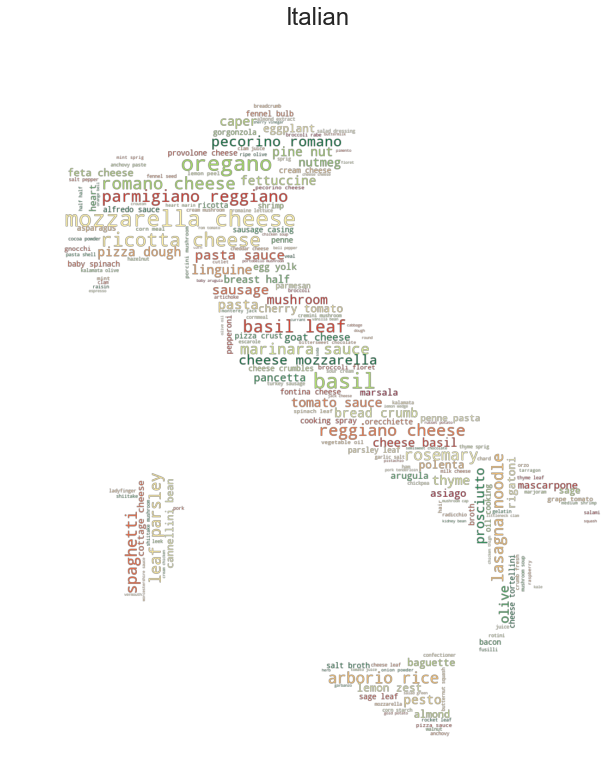

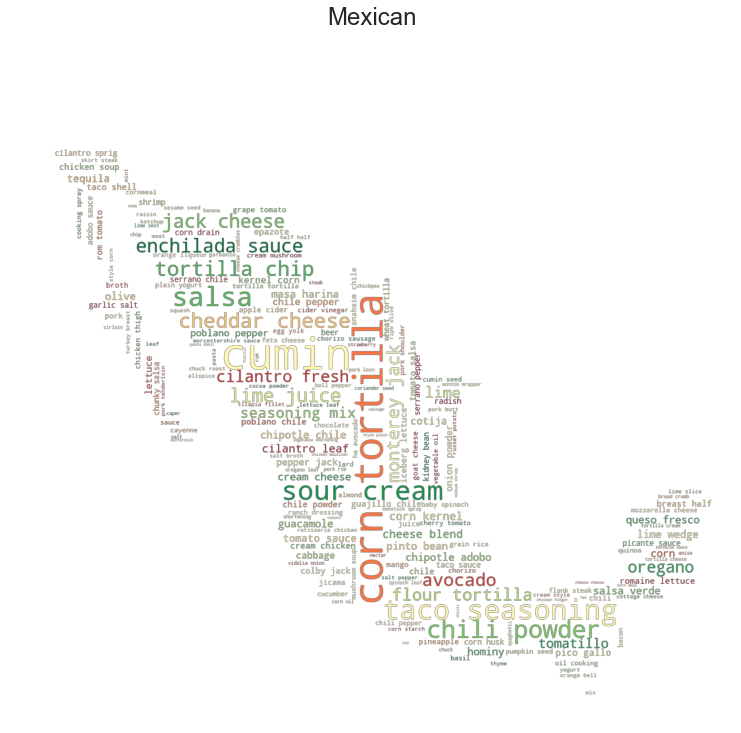

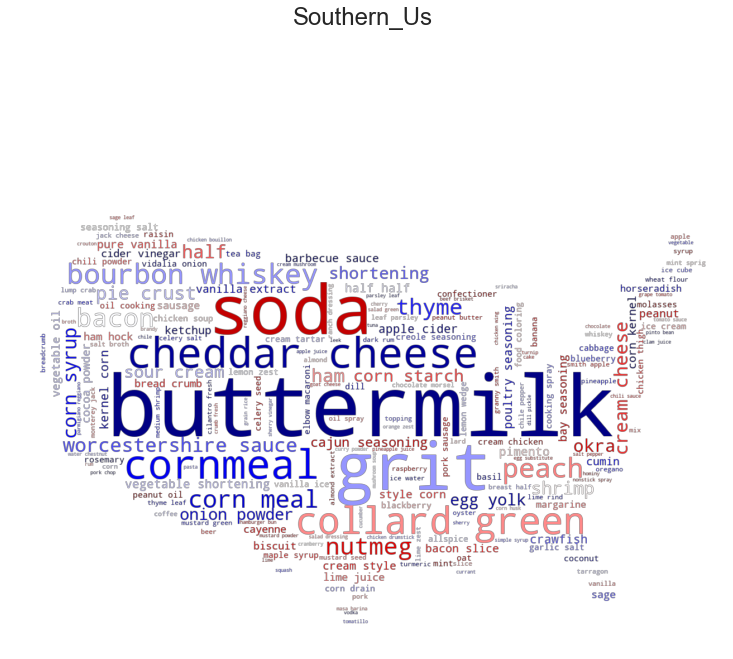

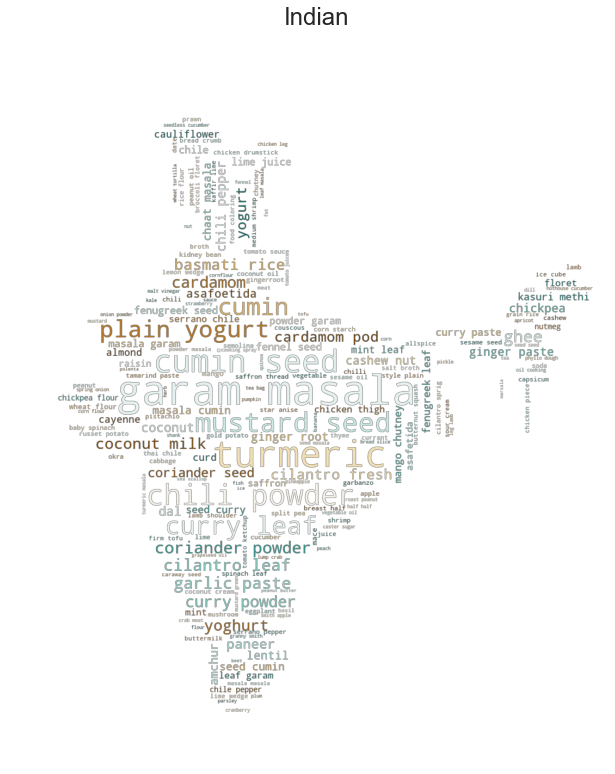

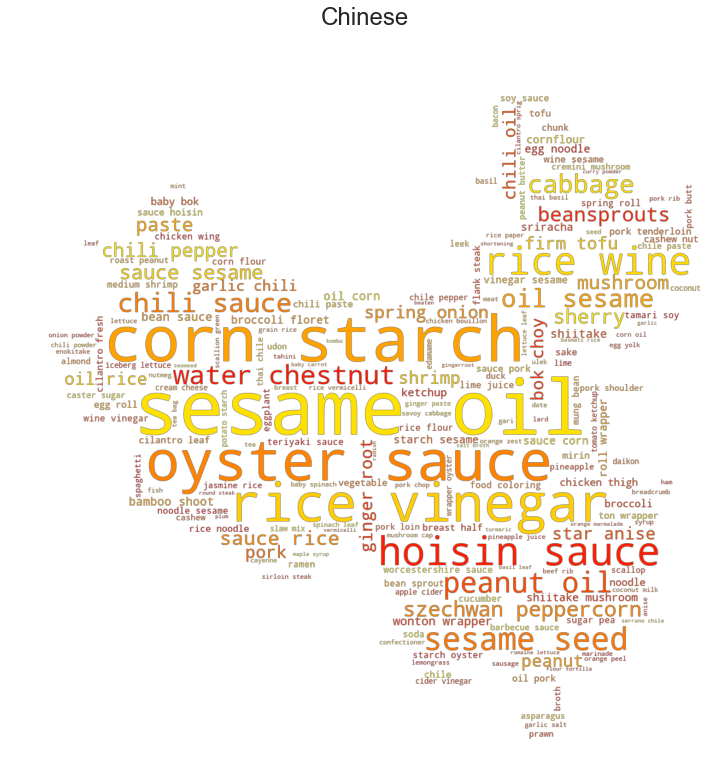

...

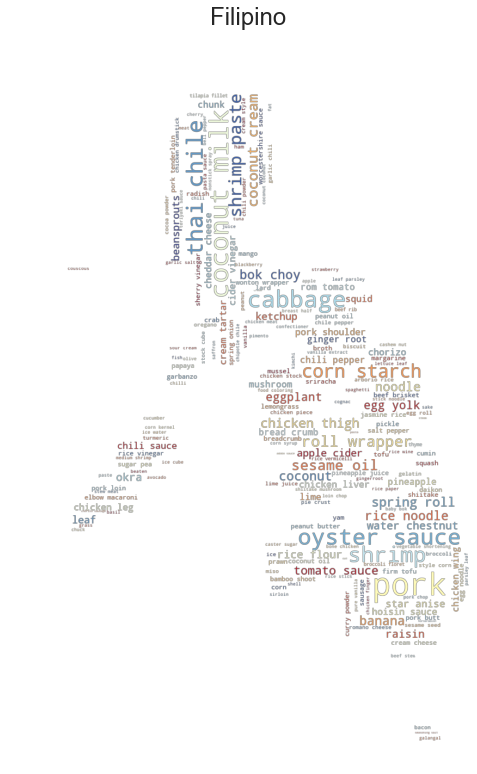

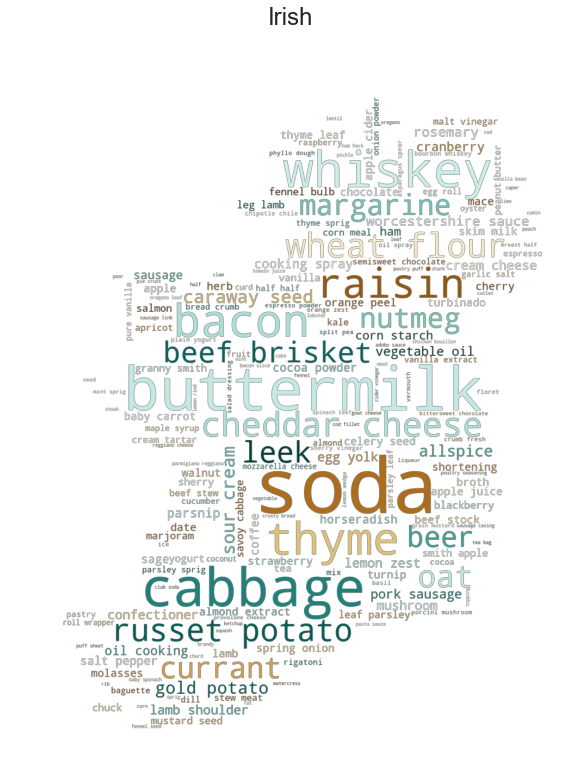

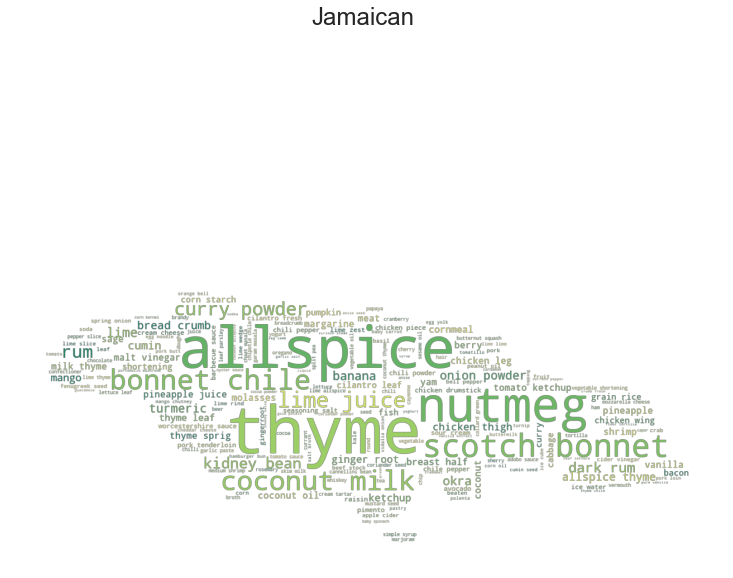

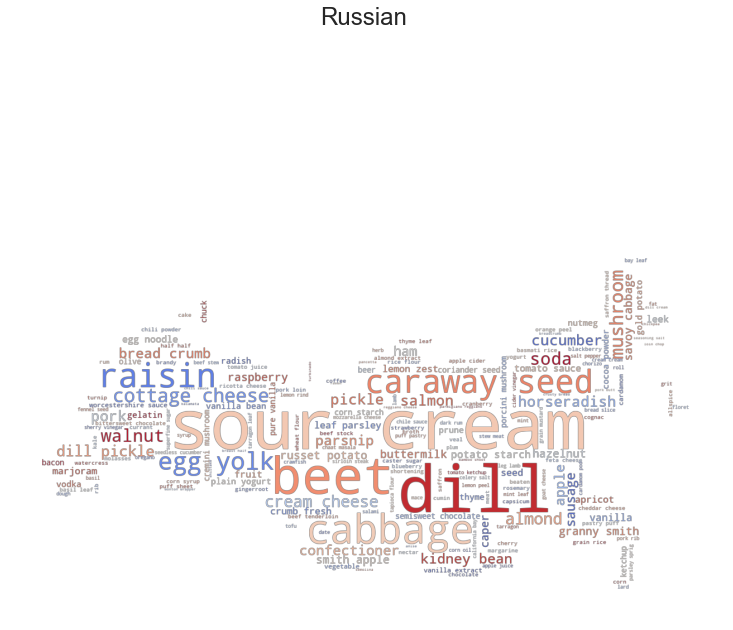

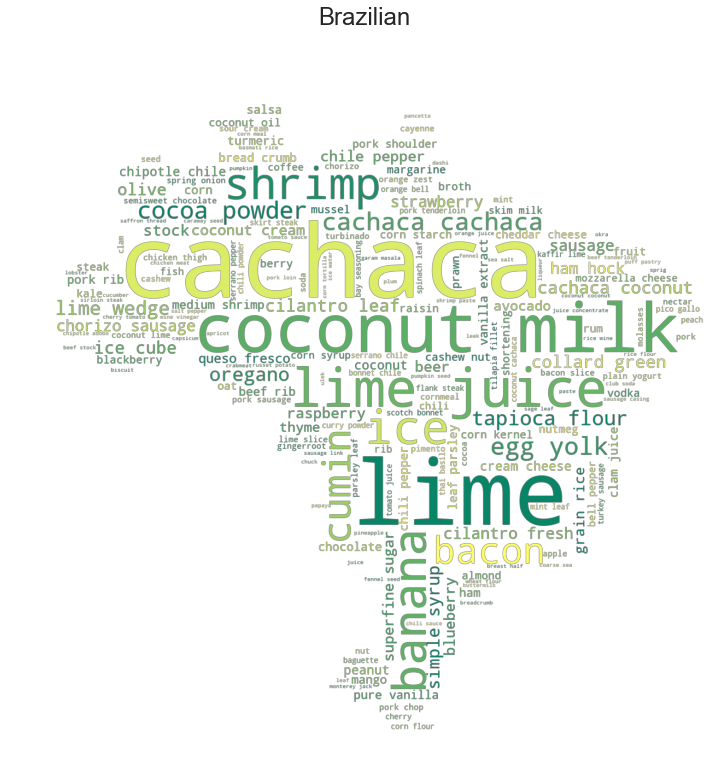

In [29]:
make_word_clouds(cuisine_list, weighted_cuisine_ingredients)

### TF-IDF for each recipe

Now that we have looked at ingredients grouped together by their cuisine, we can perform a similar representation and visualization by processing each recipe individually into a TF-IDF weighted format.

In [30]:
# Create copy of dataframe for modification
data2 = pd.DataFrame(data=data.loc[:, 'cuisine'])

# loop through recipes in data2 and convert ingredient list to string
ingredient_strings = [', '.join(recipe) for recipe in data.ingredients]
data2['ingredients'] = ingredient_strings


In [138]:
# Create TF-IDF weighting dictionary for each cuisine, exclude terms that appear in every cuisine
tfidf2 = TfidfVectorizer(tokenizer=tokenized.tokenize, max_df=0.95)

# Fit and transform cuisine ingredient lists to generate sparse matrix
ingredients_weighted2 = tfidf2.fit_transform(data2.ingredients)

In [139]:
# Display information about 
ingredients_weighted2

<39757x720 sparse matrix of type '<class 'numpy.float64'>'
	with 267634 stored elements in Compressed Sparse Row format>

This time, instead of just projecting the data onto 2 dimensions, we will compress the data onto about 100 dimensions and then use a Truncated SVD model to find groupings within the recipes.

In [78]:
# Project the vectors onto 2 dimensional space
svd = TruncatedSVD(n_components=100)
docs2 = svd.fit_transform(ingredients_weighted2)

In [79]:
ingredients_tsne = TSNE(n_components=2, perplexity=40, verbose=2, n_iter=20000, learning_rate=200).fit_transform(docs2[:10000,:])

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.078s...
[t-SNE] Computed neighbors for 10000 samples in 25.585s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.204355
[t-SNE] Computed conditional probabilities in 0.640s
[t-SNE] Iteration 50: error = 90.9474792, gradient norm = 0.0074290 (50 iterations in 30.109s)
[t-SNE]

[t-SNE] Iteration 3850: error = 2.4393678, gradient norm = 0.0000163 (50 iterations in 23.744s)
[t-SNE] Iteration 3900: error = 2.4391415, gradient norm = 0.0000151 (50 iterations in 23.307s)
[t-SNE] Iteration 3950: error = 2.4388764, gradient norm = 0.0000157 (50 iterations in 23.947s)
[t-SNE] Iteration 4000: error = 2.4386106, gradient norm = 0.0000156 (50 iterations in 23.447s)
[t-SNE] Iteration 4050: error = 2.4383683, gradient norm = 0.0000149 (50 iterations in 23.510s)
[t-SNE] Iteration 4100: error = 2.4381711, gradient norm = 0.0000158 (50 iterations in 23.323s)
[t-SNE] Iteration 4150: error = 2.4379807, gradient norm = 0.0000149 (50 iterations in 23.572s)
[t-SNE] Iteration 4200: error = 2.4377890, gradient norm = 0.0000152 (50 iterations in 23.822s)
[t-SNE] Iteration 4250: error = 2.4375525, gradient norm = 0.0000152 (50 iterations in 23.588s)
[t-SNE] Iteration 4300: error = 2.4373689, gradient norm = 0.0000164 (50 iterations in 23.728s)
[t-SNE] Iteration 4350: error = 2.437157

[t-SNE] Iteration 8150: error = 2.4282978, gradient norm = 0.0000112 (50 iterations in 23.557s)
[t-SNE] Iteration 8200: error = 2.4282038, gradient norm = 0.0000120 (50 iterations in 23.323s)
[t-SNE] Iteration 8250: error = 2.4281261, gradient norm = 0.0000115 (50 iterations in 24.461s)
[t-SNE] Iteration 8300: error = 2.4280565, gradient norm = 0.0000123 (50 iterations in 23.416s)
[t-SNE] Iteration 8350: error = 2.4279971, gradient norm = 0.0000119 (50 iterations in 23.682s)
[t-SNE] Iteration 8400: error = 2.4279318, gradient norm = 0.0000121 (50 iterations in 23.589s)
[t-SNE] Iteration 8450: error = 2.4278960, gradient norm = 0.0000126 (50 iterations in 23.822s)
[t-SNE] Iteration 8500: error = 2.4278138, gradient norm = 0.0000120 (50 iterations in 23.744s)
[t-SNE] Iteration 8550: error = 2.4277480, gradient norm = 0.0000106 (50 iterations in 23.697s)
[t-SNE] Iteration 8600: error = 2.4276774, gradient norm = 0.0000105 (50 iterations in 23.338s)
[t-SNE] Iteration 8650: error = 2.427611

[t-SNE] Iteration 12400: error = 2.4233286, gradient norm = 0.0000100 (50 iterations in 23.666s)
[t-SNE] Iteration 12450: error = 2.4232531, gradient norm = 0.0000117 (50 iterations in 23.401s)
[t-SNE] Iteration 12500: error = 2.4232328, gradient norm = 0.0000123 (50 iterations in 23.603s)
[t-SNE] Iteration 12550: error = 2.4231589, gradient norm = 0.0000117 (50 iterations in 23.775s)
[t-SNE] Iteration 12600: error = 2.4231207, gradient norm = 0.0000114 (50 iterations in 24.602s)
[t-SNE] Iteration 12650: error = 2.4230676, gradient norm = 0.0000107 (50 iterations in 23.541s)
[t-SNE] Iteration 12700: error = 2.4230132, gradient norm = 0.0000103 (50 iterations in 23.791s)
[t-SNE] Iteration 12750: error = 2.4229367, gradient norm = 0.0000111 (50 iterations in 23.385s)
[t-SNE] Iteration 12800: error = 2.4229186, gradient norm = 0.0000111 (50 iterations in 23.806s)
[t-SNE] Iteration 12850: error = 2.4228530, gradient norm = 0.0000105 (50 iterations in 23.650s)
[t-SNE] Iteration 12900: error

[t-SNE] Iteration 16650: error = 2.4193330, gradient norm = 0.0000100 (50 iterations in 23.853s)
[t-SNE] Iteration 16700: error = 2.4192636, gradient norm = 0.0000097 (50 iterations in 23.447s)
[t-SNE] Iteration 16750: error = 2.4192438, gradient norm = 0.0000093 (50 iterations in 23.666s)
[t-SNE] Iteration 16800: error = 2.4192173, gradient norm = 0.0000102 (50 iterations in 23.666s)
[t-SNE] Iteration 16850: error = 2.4192073, gradient norm = 0.0000107 (50 iterations in 23.635s)
[t-SNE] Iteration 16900: error = 2.4191704, gradient norm = 0.0000098 (50 iterations in 24.118s)
[t-SNE] Iteration 16950: error = 2.4191449, gradient norm = 0.0000108 (50 iterations in 23.510s)
[t-SNE] Iteration 17000: error = 2.4190888, gradient norm = 0.0000138 (50 iterations in 24.087s)
[t-SNE] Iteration 17050: error = 2.4190485, gradient norm = 0.0000092 (50 iterations in 23.510s)
[t-SNE] Iteration 17100: error = 2.4190278, gradient norm = 0.0000091 (50 iterations in 23.902s)
[t-SNE] Iteration 17150: error

In [158]:
# create a list of colors corresponding to cuisine category
colors = [cm.tab20(np.linspace(0, 1, 20))[cuisine_list.index(x)] for x in data2.cuisine]

# create a legend for t-SNE graphic cuisines
handlelist = [plt.plot([], marker="o", ls="", color=color)[0] for color in cm.tab20(np.linspace(0, 1, 20))]

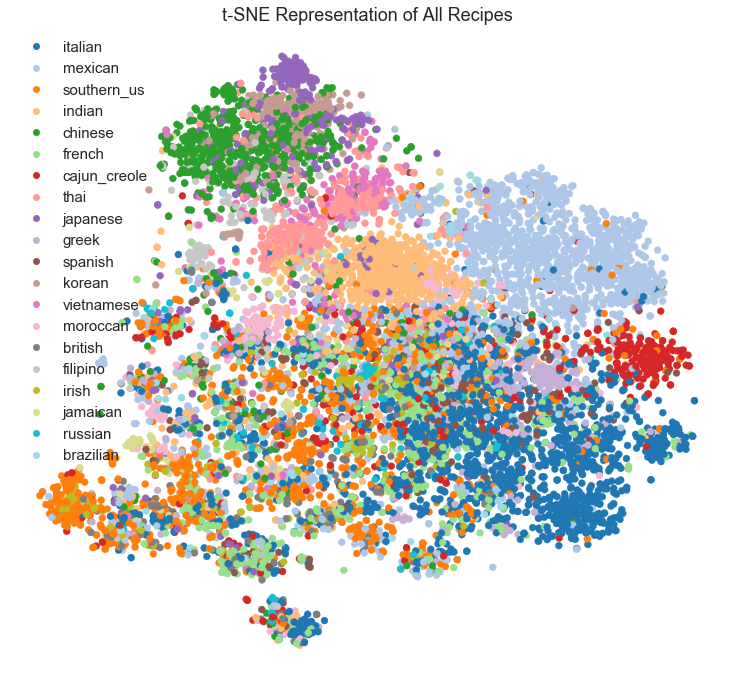

In [169]:
# Create a formatted graphic showing scatterplot representation of 20,000 recipes
fig = plt.figure(figsize=(10,10))
ax = plt.axes(frameon = False)
plt.setp(ax, xticks=(), yticks=())
plt.subplots_adjust(left=0.0, bottom=0.0, right=1.0, top=0.9, wspace=0.0, hspace=0.0)
plt.title('t-SNE Representation of All Recipes')

# Color the scatterplot by cuisine
plt.scatter(ingredients_tsne[:,0], ingredients_tsne[:,1], c=colors)
plt.legend(handlelist, cuisine_list, loc='best')

# Display plot
plt.show()

We can see above that there are nice groupings for most of the data above! The algorithm has done a good job representing each individual recipe with its associated cuisine. There is still room for improvement here though, since several of the cuisines with less entries such as British, Irish, Russian, etc. Are still quite spread out.

There are two corrections we can make to attempt to fix this. First, the distribution of recipes should be equalized, so that each cuisine is represented an approximately equal amount. Second, This model still includes ubiquitous ingredients such as Salt, Onion, Garlic, etc.! These entries should be excluded, similar to the previous work that was done during building of the tf-idf model. Making these corrections are likely to improve the groupings of recipes performed by t-SNE.

In [171]:
# Create TF-IDF weighting dictionary for each cuisine, exclude terms that appear in every cuisine
tfidf3 = TfidfVectorizer(tokenizer=tokenized.tokenize, max_df=0.1)

# Fit and transform cuisine ingredient lists to generate sparse matrix
ingredients_weighted3 = tfidf3.fit_transform(data2.ingredients)

In [172]:
# Display information about 
ingredients_weighted3

<39757x716 sparse matrix of type '<class 'numpy.float64'>'
	with 250070 stored elements in Compressed Sparse Row format>

In [173]:
# Display the ingredients with the top mean tf-idf weights in the model
top_indices = sorted([x for x in range(len(tfidf3.get_feature_names()))], key=lambda x: np.mean(ingredients_weighted3[:, x]), reverse=True)

for index in top_indices[:10]:
    print(tfidf3.get_feature_names()[index])
    

cheese
lemon juice
bell pepper
cumin
cream
carrot
parsley
powder
oregano
sauce


The list above shows the ingredients with the highest average TF-IDF score. We can see that now ingredients like salt and onions are not dominated the ingredients as they were before. Next we will gather an equal number of recipes for each cuisine for our t-SNE model.

In [196]:
equalized_indices = []
for category in cuisine_list:
    equalized_indices.extend(data2[data2.cuisine == category][:467].index)

In [197]:
len(equalized_indices)

9340

In [199]:
ingredients_weighted_equalized = tfidf3.transform(data2.ingredients[equalized_indices])

In [201]:
ingredients_weighted_equalized

<9340x716 sparse matrix of type '<class 'numpy.float64'>'
	with 58087 stored elements in Compressed Sparse Row format>

In [223]:
# Project the vectors onto 2 dimensional space
svd = TruncatedSVD(n_components=50)
docs3 = svd.fit_transform(ingredients_weighted_equalized)

In [238]:
ingredients_tsne_optimized = TSNE(n_components=2,
                                  early_exaggeration = 1,
                                  perplexity=50,
                                  verbose=2,
                                  n_iter=50000,
                                  learning_rate=700).fit_transform(docs3)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 9340 samples in 0.031s...
[t-SNE] Computed neighbors for 9340 samples in 10.764s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9340
[t-SNE] Computed conditional probabilities for sample 2000 / 9340
[t-SNE] Computed conditional probabilities for sample 3000 / 9340
[t-SNE] Computed conditional probabilities for sample 4000 / 9340
[t-SNE] Computed conditional probabilities for sample 5000 / 9340
[t-SNE] Computed conditional probabilities for sample 6000 / 9340
[t-SNE] Computed conditional probabilities for sample 7000 / 9340
[t-SNE] Computed conditional probabilities for sample 8000 / 9340
[t-SNE] Computed conditional probabilities for sample 9000 / 9340
[t-SNE] Computed conditional probabilities for sample 9340 / 9340
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.952s
[t-SNE] Iteration 50: error = 2.8129728, gradient norm = 0.0012360 (50 iterations in 23.759s)
[t-SNE] Iteration 100

[t-SNE] Iteration 3850: error = 1.7269123, gradient norm = 0.0000279 (50 iterations in 21.919s)
[t-SNE] Iteration 3900: error = 1.7267524, gradient norm = 0.0000206 (50 iterations in 21.419s)
[t-SNE] Iteration 3950: error = 1.7266595, gradient norm = 0.0000227 (50 iterations in 21.919s)
[t-SNE] Iteration 4000: error = 1.7263925, gradient norm = 0.0000192 (50 iterations in 21.841s)
[t-SNE] Iteration 4050: error = 1.7261215, gradient norm = 0.0000207 (50 iterations in 21.981s)
[t-SNE] Iteration 4100: error = 1.7258974, gradient norm = 0.0000251 (50 iterations in 21.794s)
[t-SNE] Iteration 4150: error = 1.7257117, gradient norm = 0.0000173 (50 iterations in 21.763s)
[t-SNE] Iteration 4200: error = 1.7255211, gradient norm = 0.0000185 (50 iterations in 22.012s)
[t-SNE] Iteration 4250: error = 1.7253208, gradient norm = 0.0000207 (50 iterations in 21.466s)
[t-SNE] Iteration 4300: error = 1.7251761, gradient norm = 0.0000192 (50 iterations in 21.638s)
[t-SNE] Iteration 4350: error = 1.725040

[t-SNE] Iteration 8150: error = 1.7150810, gradient norm = 0.0000180 (50 iterations in 22.789s)
[t-SNE] Iteration 8200: error = 1.7150494, gradient norm = 0.0000196 (50 iterations in 23.673s)
[t-SNE] Iteration 8250: error = 1.7150266, gradient norm = 0.0000196 (50 iterations in 25.381s)
[t-SNE] Iteration 8300: error = 1.7149577, gradient norm = 0.0000220 (50 iterations in 23.149s)
[t-SNE] Iteration 8350: error = 1.7149383, gradient norm = 0.0000177 (50 iterations in 22.940s)
[t-SNE] Iteration 8400: error = 1.7148341, gradient norm = 0.0000184 (50 iterations in 22.884s)
[t-SNE] Iteration 8450: error = 1.7148107, gradient norm = 0.0000145 (50 iterations in 22.215s)
[t-SNE] Iteration 8500: error = 1.7147862, gradient norm = 0.0000200 (50 iterations in 23.499s)
[t-SNE] Iteration 8550: error = 1.7146573, gradient norm = 0.0000174 (50 iterations in 23.447s)
[t-SNE] Iteration 8600: error = 1.7146096, gradient norm = 0.0000194 (50 iterations in 22.293s)
[t-SNE] Iteration 8650: error = 1.714511

[t-SNE] Iteration 12400: error = 1.7115742, gradient norm = 0.0000160 (50 iterations in 22.324s)
[t-SNE] Iteration 12450: error = 1.7115096, gradient norm = 0.0000134 (50 iterations in 22.277s)
[t-SNE] Iteration 12500: error = 1.7115334, gradient norm = 0.0000146 (50 iterations in 22.059s)
[t-SNE] Iteration 12550: error = 1.7114826, gradient norm = 0.0000157 (50 iterations in 22.954s)
[t-SNE] Iteration 12600: error = 1.7114683, gradient norm = 0.0000151 (50 iterations in 22.322s)
[t-SNE] Iteration 12650: error = 1.7114211, gradient norm = 0.0000130 (50 iterations in 21.965s)
[t-SNE] Iteration 12700: error = 1.7113383, gradient norm = 0.0000159 (50 iterations in 22.745s)
[t-SNE] Iteration 12750: error = 1.7113463, gradient norm = 0.0000162 (50 iterations in 22.418s)
[t-SNE] Iteration 12800: error = 1.7112787, gradient norm = 0.0000183 (50 iterations in 21.950s)
[t-SNE] Iteration 12850: error = 1.7112923, gradient norm = 0.0000183 (50 iterations in 22.324s)
[t-SNE] Iteration 12900: error

[t-SNE] Iteration 16650: error = 1.7092638, gradient norm = 0.0000203 (50 iterations in 22.324s)
[t-SNE] Iteration 16700: error = 1.7092301, gradient norm = 0.0000181 (50 iterations in 22.558s)
[t-SNE] Iteration 16750: error = 1.7091613, gradient norm = 0.0000168 (50 iterations in 22.496s)
[t-SNE] Iteration 16800: error = 1.7091606, gradient norm = 0.0000158 (50 iterations in 22.137s)
[t-SNE] Iteration 16850: error = 1.7091478, gradient norm = 0.0000148 (50 iterations in 22.044s)
[t-SNE] Iteration 16900: error = 1.7090731, gradient norm = 0.0000130 (50 iterations in 22.246s)
[t-SNE] Iteration 16950: error = 1.7091494, gradient norm = 0.0000131 (50 iterations in 22.324s)
[t-SNE] Iteration 17000: error = 1.7091392, gradient norm = 0.0000139 (50 iterations in 22.652s)
[t-SNE] Iteration 17050: error = 1.7090849, gradient norm = 0.0000216 (50 iterations in 22.137s)
[t-SNE] Iteration 17100: error = 1.7090647, gradient norm = 0.0000152 (50 iterations in 22.184s)
[t-SNE] Iteration 17150: error

[t-SNE] Iteration 20900: error = 1.7008651, gradient norm = 0.0000170 (50 iterations in 22.137s)
[t-SNE] Iteration 20950: error = 1.7008549, gradient norm = 0.0000209 (50 iterations in 21.700s)
[t-SNE] Iteration 21000: error = 1.7008637, gradient norm = 0.0000173 (50 iterations in 21.669s)
[t-SNE] Iteration 21050: error = 1.7008064, gradient norm = 0.0000186 (50 iterations in 22.262s)
[t-SNE] Iteration 21100: error = 1.7007436, gradient norm = 0.0000219 (50 iterations in 21.544s)
[t-SNE] Iteration 21150: error = 1.7007430, gradient norm = 0.0000192 (50 iterations in 21.794s)
[t-SNE] Iteration 21200: error = 1.7007326, gradient norm = 0.0000189 (50 iterations in 21.950s)
[t-SNE] Iteration 21250: error = 1.7007233, gradient norm = 0.0000183 (50 iterations in 21.716s)
[t-SNE] Iteration 21300: error = 1.7007551, gradient norm = 0.0000151 (50 iterations in 22.043s)
[t-SNE] Iteration 21350: error = 1.7007257, gradient norm = 0.0000156 (50 iterations in 21.981s)
[t-SNE] Iteration 21400: error

[t-SNE] Iteration 25150: error = 1.6997029, gradient norm = 0.0000147 (50 iterations in 21.794s)
[t-SNE] Iteration 25200: error = 1.6997176, gradient norm = 0.0000132 (50 iterations in 21.638s)
[t-SNE] Iteration 25250: error = 1.6996915, gradient norm = 0.0000144 (50 iterations in 21.809s)
[t-SNE] Iteration 25250: did not make any progress during the last 300 episodes. Finished.
[t-SNE] Error after 25250 iterations: 1.699692


In [204]:
# create a list of colors corresponding to cuisine category
colors2 = [cm.tab20(np.linspace(0, 1, 20))[cuisine_list.index(x)] for x in data2.cuisine[equalized_indices]]

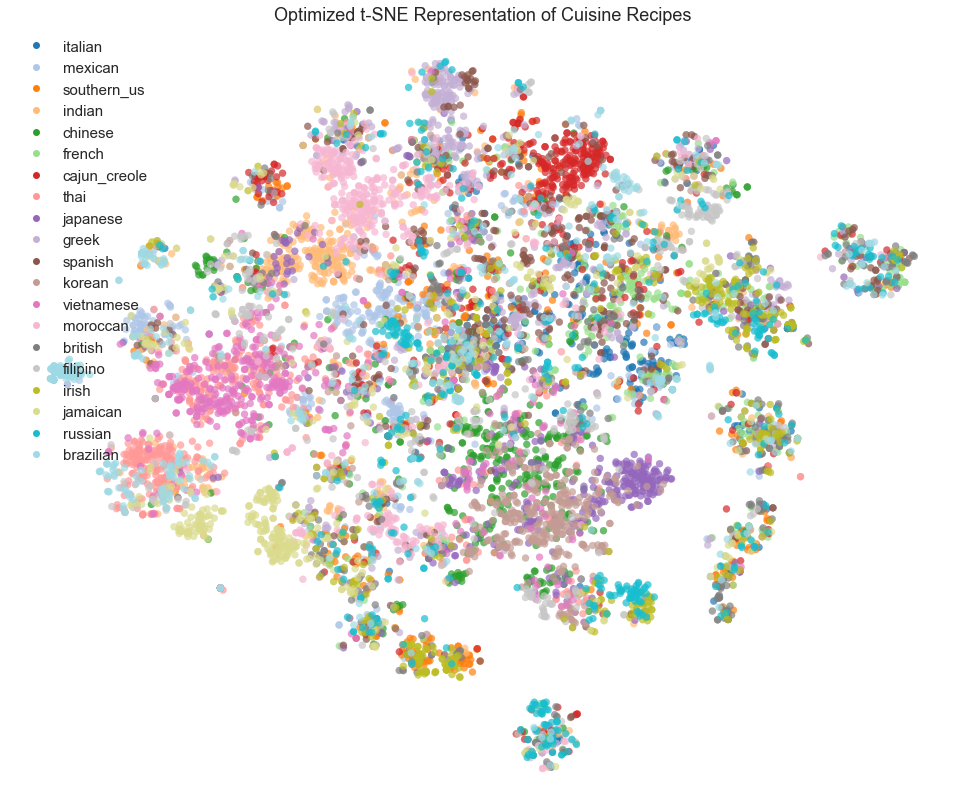

In [251]:
# Create a formatted graphic showing scatterplot representation of 20,000 recipes
fig = plt.figure(figsize=(12,12))
ax = plt.axes(frameon = False)
plt.setp(ax, xticks=(), yticks=())
plt.subplots_adjust(left=0.0, bottom=0.0, right=1.1, top=0.9, wspace=0.5, hspace=0.0)
plt.title('Optimized t-SNE Representation of Cuisine Recipes')

# Color the scatterplot by cuisine
plt.scatter(ingredients_tsne_optimized[:,0], ingredients_tsne_optimized[:,1], c=colors2, alpha=0.7)
plt.legend(handlelist, cuisine_list, loc='upper left')
plt.savefig('images/optimized_tsne_2.png', format='png', dpi=300)

# Display plot
plt.show()